# Fifa Data Scraper
This is a script that scrapes sofifa.com to create a women's soccer player dataset

#### By Khyatee Desai

In [271]:
import html
from bs4 import BeautifulSoup
import requests
import re
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', None)

## Women's Fifa Data
Create list of every year/page combination, then request every url and save the html locally
gender = 1

In [272]:
# base_url = 'https://sofifa.com/players?gender=1&showCol%5B0%5D=pi&showCol%5B1%5D=ae&showCol%5B2%5D=hi&showCol%5B3%5D=wi&showCol%5B4%5D=oa&showCol%5B5%5D=pt&showCol%5B6%5D=vl&showCol%5B7%5D=wg&showCol%5B8%5D=pf&showCol%5B9%5D=bp&showCol%5B10%5D=gu&showCol%5B11%5D=jt&showCol%5B12%5D=ta&showCol%5B13%5D=cr&showCol%5B14%5D=fi&showCol%5B15%5D=he&showCol%5B16%5D=sh&showCol%5B17%5D=vo&showCol%5B18%5D=ts&showCol%5B19%5D=dr&showCol%5B20%5D=cu&showCol%5B21%5D=fr&showCol%5B22%5D=lo&showCol%5B23%5D=bl&showCol%5B24%5D=to&showCol%5B25%5D=ac&showCol%5B26%5D=sp&showCol%5B27%5D=ag&showCol%5B28%5D=re&showCol%5B29%5D=ba&showCol%5B30%5D=tp&showCol%5B31%5D=so&showCol%5B32%5D=ju&showCol%5B33%5D=st&showCol%5B34%5D=sr&showCol%5B35%5D=ln&showCol%5B36%5D=te&showCol%5B37%5D=ar&showCol%5B38%5D=in&showCol%5B39%5D=po&showCol%5B40%5D=vi&showCol%5B41%5D=pe&showCol%5B42%5D=cm&showCol%5B43%5D=sl&showCol%5B44%5D=td&showCol%5B45%5D=sa&showCol%5B46%5D=tg&r='
# pages = ['01','02','03','04','05','06','07','08','09'] + list(range(10,100))
# end = '&set=true'

# for yr in ['07','08','09','10','11','12','13','14','15','16','17','18','19','20','21']:
#     for page in pages:
#         date = "{}00{}".format(yr, str(page))
#         url = base_url+date+end
#         r = requests.get(url) 
#         html = r.text
#         f = open('women_scraped_fifa/'+date, 'w')
#         f.write(html)
#         f.close()


### Scrape Column Headers

In [273]:
# headers = soup.find_all("thead")[0]

In [274]:
# col_names = []
# for col in headers.find_all('th')[1:]:
#     col_names.append(col.text)
# print(col_names)

In [275]:
# hard coding it
col_names = ['Name', 'Age', 'OVA', 'POT', 'Team & Contract', 'ID', 'Height', 'Weight', 'foot', 'BP', 'Growth', 'Joined', 'Value', 'Wage', 'Attacking', 'Crossing', 'Finishing', 'Heading Accuracy', 'Short Passing', 'Volleys', 'Skill', 'Dribbling', 'Curve', 'FK Accuracy', 'Long Passing', 'Ball Control', 'Movement', 'Acceleration', 'Sprint Speed', 'Agility', 'Reactions', 'Balance', 'Power', 'Shot Power', 'Jumping', 'Stamina', 'Strength', 'Long Shots', 'Mentality', 'Aggression', 'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure', 'Defending', 'Standing Tackle', 'Sliding Tackle', 'Goalkeeping', 'Hits']

### Open files and read into beautiful soup

In [276]:
import os
output_all = []
output = []
for filename in os.listdir('women_scraped_fifa'):
    try:
        f = open('women_scraped_fifa/'+filename, 'rb')
        soup = BeautifulSoup(f, "html.parser")
        body = soup.find_all("tbody", {"class": "list"})[0]

        for row in body.find_all('tr'):
            player = []
            for col in row.find_all('td')[1:]:
                text = col.text.replace('\n','')
                text = text.replace('Free','') # remove word Free after country name
                text = re.sub('[A-Z][A-Z]+', '', text) # remove weird suffixes on names
                player.append(text.strip())
            output.append(player)
    except:
        pass


Some characters could not be decoded, and were replaced with REPLACEMENT CHARACTER.


## Turn into Pandas Dataframe

In [394]:
# df_women = pd.DataFrame(output, columns=col_names)
x = df_women.drop_duplicates().set_index('ID')
x

,Name,Age,OVA,POT,Team & Contract,Height,Weight,foot,BP,Growth,Joined,Value,Wage,Attacking,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,Curve,FK Accuracy,Long Passing,Ball Control,Movement,Acceleration,Sprint Speed,Agility,Reactions,Balance,Power,Shot Power,Jumping,Stamina,Strength,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Standing Tackle,Sliding Tackle,Goalkeeping,Hits
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
233746,V. Miedema,23,92,94,Netherlands,"5'9""",143lbs,Right,,2,"Jan 1, 2015",€0,€0,430,69,95,89,87,90,395,90,76,71,67,91,403,80,81,77,92,73,420,91,73,79,85,92,334,66,27,95,68,78,91,75,30,23,78,75
226328,M. Rapinoe,34,92,92,United States,"5'7""",132lbs,Right,,0,"Jan 1, 2006",€0,€0,427,94,90,76,93,74,460,94,93,88,92,93,388,75,73,83,87,70,381,82,75,70,66,88,387,67,47,90,92,91,93,140,46,48,66,48
226301,A. Morgan,30,90,90,United States,"5'7""",137lbs,Left,,0,"Jan 1, 2010",€0,€0,416,71,90,86,81,88,381,87,68,70,67,89,398,85,86,76,83,68,396,86,76,75,76,83,369,53,63,90,74,89,91,90,29,27,53,31
227125,S. Kerr,26,91,91,Australia,"5'6""",121lbs,Right,,0,"Jan 1, 2015",€0,€0,421,74,94,92,79,82,393,90,76,63,70,94,439,89,85,93,90,82,430,92,87,87,78,86,323,75,24,95,61,68,92,97,38,23,56,25
226324,C. Lloyd,37,87,87,United States,"5'8""",141lbs,Right,,0,"Jan 1, 2005",€0,€0,392,74,82,80,88,68,432,87,81,87,89,88,370,71,72,76,73,78,397,83,79,72,79,84,430,84,85,86,88,87,95,205,69,67,61,22
247512,J. Huitema,19,72,84,Canada,"5'11""",123lbs,Right,,12,"Jan 1, 2015",€0,€0,303,42,75,64,59,63,296,72,60,59,34,71,397,81,81,83,74,78,327,69,64,62,65,67,256,22,23,77,64,70,72,55,15,18,46,21
226987,K. Asllani,30,82,82,Sweden,"5'5""",126lbs,Right,,0,"Jan 1, 2015",€0,€0,374,72,78,62,77,85,410,89,81,78,76,86,407,80,74,88,76,89,341,77,67,71,50,76,325,44,45,82,78,76,77,124,28,30,54,18
227331,E. Le Sommer,31,90,90,France,"5'3""",128lbs,Right,,0,"Jul 1, 2015",€0,€0,412,56,93,91,83,89,382,83,81,65,66,87,413,78,83,81,89,82,409,92,81,71,74,91,345,58,33,90,79,85,79,113,36,25,65,18
226354,M. Leupolz,26,82,82,Germany,"5'8""",115lbs,Right,,0,"Jan 1, 2015",€0,€0,392,81,79,69,88,75,405,86,80,70,84,85,411,85,82,82,82,80,352,75,60,79,69,69,370,69,70,79,79,73,78,217,71,64,61,17


# Men's Fifa Data
There are three page results for the men, so we scrape all three pages individually
gender = 0 in URL

In [395]:
# base_url = 'https://sofifa.com/players?gender=0&showCol%5B0%5D=pi&showCol%5B1%5D=ae&showCol%5B2%5D=hi&showCol%5B3%5D=wi&showCol%5B4%5D=oa&showCol%5B5%5D=pt&showCol%5B6%5D=vl&showCol%5B7%5D=wg&showCol%5B8%5D=pf&showCol%5B9%5D=bp&showCol%5B10%5D=gu&showCol%5B11%5D=jt&showCol%5B12%5D=ta&showCol%5B13%5D=cr&showCol%5B14%5D=fi&showCol%5B15%5D=he&showCol%5B16%5D=sh&showCol%5B17%5D=vo&showCol%5B18%5D=ts&showCol%5B19%5D=dr&showCol%5B20%5D=cu&showCol%5B21%5D=fr&showCol%5B22%5D=lo&showCol%5B23%5D=bl&showCol%5B24%5D=to&showCol%5B25%5D=ac&showCol%5B26%5D=sp&showCol%5B27%5D=ag&showCol%5B28%5D=re&showCol%5B29%5D=ba&showCol%5B30%5D=tp&showCol%5B31%5D=so&showCol%5B32%5D=ju&showCol%5B33%5D=st&showCol%5B34%5D=sr&showCol%5B35%5D=ln&showCol%5B36%5D=te&showCol%5B37%5D=ar&showCol%5B38%5D=in&showCol%5B39%5D=po&showCol%5B40%5D=vi&showCol%5B41%5D=pe&showCol%5B42%5D=cm&showCol%5B43%5D=sl&showCol%5B44%5D=td&showCol%5B45%5D=sa&showCol%5B46%5D=tg&r='
# pages = ['01','02','03','04','05','06','07','08','09'] + list(range(10,100))
# end = '&set=true'

# for yr in ['07','08','09','10','11','12','13','14','15','16','17','18','19','20','21']:
#     for page in pages:
#         date = "{}00{}".format(yr, str(page))
#         url = base_url+date+end
#         r = requests.get(url) 
#         html = r.text
#         f = open('men_scraped_fifa/'+date, 'w')
#         f.write(html)
#         f.close()


### Table Body

In [253]:

output = []
for filename in os.listdir('men_scraped_fifa'):
    try:
        f = open('men_scraped_fifa/'+filename, 'rb')
        soup = BeautifulSoup(f, "html.parser")
        body = soup.find_all("tbody", {"class": "list"})[0]

        for row in body.find_all('tr'):
            player = []
            for col in row.find_all('td')[1:]:
                text = col.text.replace('\n','')
                text = text.replace('Free','') # remove word Free after country name
                text = re.sub('[A-Z][A-Z]+', '', text) # remove weird suffixes on names
                player.append(text.strip())
            output.append(player)
    except:
        pass


## Turn into Pandas Dataframe

In [396]:
# df_men = pd.DataFrame(output, columns=col_names)
y = df_men.drop_duplicates().set_index('ID')
y

,Name,Age,OVA,POT,Team & Contract,Height,Weight,foot,BP,Growth,Joined,Value,Wage,Attacking,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,Curve,FK Accuracy,Long Passing,Ball Control,Movement,Acceleration,Sprint Speed,Agility,Reactions,Balance,Power,Shot Power,Jumping,Stamina,Strength,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Standing Tackle,Sliding Tackle,Goalkeeping,Hits,Gender
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
236499,Douglas Luiz,22,76,83,Aston Villa2019 ~ 2023,"5'9""",146lbs,Right,,7,"Jul 25, 2019",€14.5M,€40K,330,69,64,62,77,58,358,74,66,63,77,78,359,65,66,74,80,74,359,76,66,73,68,76,315,74,73,52,72,44,75,217,75,71,48,7.7K,M
208919,R. Gauld,24,74,79,Farense2020 ~ 2021,"5'7""",137lbs,Left,,5,"Jul 15, 2020",€6.5M,€7K,328,77,67,46,72,66,372,80,78,72,64,78,416,83,77,91,75,90,309,68,74,80,32,55,311,48,46,70,78,69,73,129,50,39,61,6.7K,M
192505,R. Lukaku,27,86,86,Inter2019 ~ 2024,"6'3""",207lbs,Left,,0,"Aug 8, 2019",€73.5M,€175K,402,73,88,87,77,77,372,78,78,66,70,80,355,78,84,60,87,46,400,87,71,73,95,74,348,71,27,87,75,88,86,101,41,30,54,6.7K,M
206517,J. Grealish,24,83,86,Aston Villa2012 ~ 2025,"5'11""",150lbs,Right,,3,"Mar 1, 2012",€49.5M,€82K,351,81,77,36,85,72,406,88,77,74,82,85,406,79,79,85,79,84,333,75,37,80,61,80,328,60,44,81,85,58,83,140,49,43,51,6K,M
258370,Bruno Fuchs,21,72,82,Moscow2020 ~ 2025,"6'3""",187lbs,Right,,10,"Aug 25, 2020",€4.9M,€19K,281,55,53,68,72,33,270,66,34,28,74,68,347,66,74,62,73,72,338,67,60,71,75,65,300,71,72,45,70,42,73,217,73,69,46,5.7K,M
229906,L. Bailey,22,81,85,Bayer 04 Leverkusen2017 ~ 2023,"5'10""",174lbs,Left,,4,"Jan 31, 2017",€37.5M,€70K,354,73,77,57,73,74,388,86,79,79,63,81,438,93,94,87,80,84,368,79,77,75,59,78,308,58,21,80,78,71,75,88,25,18,60,4.9K,M
254796,N. Madueke,18,74,87,2019 ~ 2024,"6'0""",154lbs,Left,,13,"Dec 21, 2019",€10M,€6K,304,63,70,42,69,60,350,80,72,58,62,78,416,92,90,83,72,79,331,68,75,59,63,66,279,55,31,63,69,61,69,111,32,37,51,4.1K,M
232488,C. Romero,22,78,84,"AtalantaJun 30, 2021 On Loan","6'1""",174lbs,Right,,6,"Jul 12, 2019",€20.5M,€55K,232,31,26,82,60,33,217,50,35,29,46,57,347,69,67,66,78,67,319,51,77,77,77,37,275,88,80,31,36,40,70,237,78,80,47,4K,M
251854,Pedri,17,77,91,Barcelona2020 ~ 2022,"5'9""",134lbs,Right,,14,"Aug 4, 2020",€24M,€15K,312,65,72,50,80,45,353,80,64,51,79,79,413,86,76,87,75,89,322,62,64,74,52,70,325,59,55,77,81,53,82,176,71,60,46,2.9K,M


# Clean Dataframes
### Add gender column

In [397]:
y['Gender'] = 'M'
x['Gender'] = "W"

## Concat the dataframes together

In [398]:
df = pd.concat([y,x])

### Change some column names for clarity

In [399]:
df.columns

Index(['Name', 'Age', 'OVA', 'POT', 'Team & Contract', 'Height', 'Weight',
       'foot', 'BP', 'Growth', 'Joined', 'Value', 'Wage', 'Attacking',
       'Crossing', 'Finishing', 'Heading Accuracy', 'Short Passing', 'Volleys',
       'Skill', 'Dribbling', 'Curve', 'FK Accuracy', 'Long Passing',
       'Ball Control', 'Movement', 'Acceleration', 'Sprint Speed', 'Agility',
       'Reactions', 'Balance', 'Power', 'Shot Power', 'Jumping', 'Stamina',
       'Strength', 'Long Shots', 'Mentality', 'Aggression', 'Interceptions',
       'Positioning', 'Vision', 'Penalties', 'Composure', 'Defending',
       'Standing Tackle', 'Sliding Tackle', 'Goalkeeping', 'Hits', 'Gender'],
      dtype='object')

In [400]:
df.rename(columns={'OVA': 'Rating', 'POT':'Potential', 'Team & Contract':'Team',
                   'BP': 'Best Position', 'foot':'Foot', 'Height': "Height (Inches)",
                  'Weight': 'Weight (lbs)', 'Wage': "Wage (Thousand €)",
                  'Value': "Value (Mill €)"}, inplace=True)

In [401]:
df.head()

,Name,Age,Rating,Potential,Team,Height (Inches),Weight (lbs),Foot,Best Position,Growth,Joined,Value (Mill €),Wage (Thousand €),Attacking,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,Curve,FK Accuracy,Long Passing,Ball Control,Movement,Acceleration,Sprint Speed,Agility,Reactions,Balance,Power,Shot Power,Jumping,Stamina,Strength,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Standing Tackle,Sliding Tackle,Goalkeeping,Hits,Gender
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
236499,Douglas Luiz,22,76,83,Aston Villa2019 ~ 2023,"5'9""",146lbs,Right,,7,"Jul 25, 2019",€14.5M,€40K,330,69,64,62,77,58,358,74,66,63,77,78,359,65,66,74,80,74,359,76,66,73,68,76,315,74,73,52,72,44,75,217,75,71,48,7.7K,M
208919,R. Gauld,24,74,79,Farense2020 ~ 2021,"5'7""",137lbs,Left,,5,"Jul 15, 2020",€6.5M,€7K,328,77,67,46,72,66,372,80,78,72,64,78,416,83,77,91,75,90,309,68,74,80,32,55,311,48,46,70,78,69,73,129,50,39,61,6.7K,M
192505,R. Lukaku,27,86,86,Inter2019 ~ 2024,"6'3""",207lbs,Left,,0,"Aug 8, 2019",€73.5M,€175K,402,73,88,87,77,77,372,78,78,66,70,80,355,78,84,60,87,46,400,87,71,73,95,74,348,71,27,87,75,88,86,101,41,30,54,6.7K,M
206517,J. Grealish,24,83,86,Aston Villa2012 ~ 2025,"5'11""",150lbs,Right,,3,"Mar 1, 2012",€49.5M,€82K,351,81,77,36,85,72,406,88,77,74,82,85,406,79,79,85,79,84,333,75,37,80,61,80,328,60,44,81,85,58,83,140,49,43,51,6K,M
258370,Bruno Fuchs,21,72,82,Moscow2020 ~ 2025,"6'3""",187lbs,Right,,10,"Aug 25, 2020",€4.9M,€19K,281,55,53,68,72,33,270,66,34,28,74,68,347,66,74,62,73,72,338,67,60,71,75,65,300,71,72,45,70,42,73,217,73,69,46,5.7K,M


### Remove Contract Dates from the Team column

In [402]:
df['Team'] = df['Team'].str.replace('\d+ ~ \d+','')
df['Team'] = df['Team'].str.replace('\d+','')
df['Team'] = df['Team'].str.replace('Jun ,  On Loan','')
df['Team'] = df['Team'].str.replace(' Women','')


## Convert strings to floats
All columns are currently strings, so they all need to be converted to decimal numbers so that SQL aggregations can be performed down the line

In [403]:
df.dtypes

Name                 object
Age                  object
Rating               object
Potential            object
Team                 object
Height (Inches)      object
Weight (lbs)         object
Foot                 object
Best Position        object
Growth               object
Joined               object
Value (Mill €)       object
Wage (Thousand €)    object
Attacking            object
Crossing             object
Finishing            object
Heading Accuracy     object
Short Passing        object
Volleys              object
Skill                object
Dribbling            object
Curve                object
FK Accuracy          object
Long Passing         object
Ball Control         object
Movement             object
Acceleration         object
Sprint Speed         object
Agility              object
Reactions            object
Balance              object
Power                object
Shot Power           object
Jumping              object
Stamina              object
Strength            

### Convert Height to Float

In [404]:
split_heights = df['Height (Inches)'].str.split("'")

In [405]:
# separate the feet and inches, convert inches to a decimal
decimal = []
feet = []
for pair in split_heights:
    decimal.append(float(pair[1][:-1])/12)
    feet.append(float(pair[0]))

In [406]:
# combine the feet and inches again
decimal_heights = np.array(feet) + np.array(decimal)

In [407]:
# add the decimal heights to main dataframe
df['Height (Inches)'] = decimal_heights

# round to two decimal places
df['Height (Inches)'] = df['Height (Inches)'].apply(lambda x: round(x,2))

In [408]:
df.head()

,Name,Age,Rating,Potential,Team,Height (Inches),Weight (lbs),Foot,Best Position,Growth,Joined,Value (Mill €),Wage (Thousand €),Attacking,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,Curve,FK Accuracy,Long Passing,Ball Control,Movement,Acceleration,Sprint Speed,Agility,Reactions,Balance,Power,Shot Power,Jumping,Stamina,Strength,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Standing Tackle,Sliding Tackle,Goalkeeping,Hits,Gender
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
236499,Douglas Luiz,22,76,83,Aston Villa,5.75,146lbs,Right,,7,"Jul 25, 2019",€14.5M,€40K,330,69,64,62,77,58,358,74,66,63,77,78,359,65,66,74,80,74,359,76,66,73,68,76,315,74,73,52,72,44,75,217,75,71,48,7.7K,M
208919,R. Gauld,24,74,79,Farense,5.58,137lbs,Left,,5,"Jul 15, 2020",€6.5M,€7K,328,77,67,46,72,66,372,80,78,72,64,78,416,83,77,91,75,90,309,68,74,80,32,55,311,48,46,70,78,69,73,129,50,39,61,6.7K,M
192505,R. Lukaku,27,86,86,Inter,6.25,207lbs,Left,,0,"Aug 8, 2019",€73.5M,€175K,402,73,88,87,77,77,372,78,78,66,70,80,355,78,84,60,87,46,400,87,71,73,95,74,348,71,27,87,75,88,86,101,41,30,54,6.7K,M
206517,J. Grealish,24,83,86,Aston Villa,5.92,150lbs,Right,,3,"Mar 1, 2012",€49.5M,€82K,351,81,77,36,85,72,406,88,77,74,82,85,406,79,79,85,79,84,333,75,37,80,61,80,328,60,44,81,85,58,83,140,49,43,51,6K,M
258370,Bruno Fuchs,21,72,82,Moscow,6.25,187lbs,Right,,10,"Aug 25, 2020",€4.9M,€19K,281,55,53,68,72,33,270,66,34,28,74,68,347,66,74,62,73,72,338,67,60,71,75,65,300,71,72,45,70,42,73,217,73,69,46,5.7K,M


### Remove text from Weight Column
So that it can be converted to float

In [409]:
df['Weight (lbs)'] = df['Weight (lbs)'].str.replace('lbs','')

In [410]:
df.head()

,Name,Age,Rating,Potential,Team,Height (Inches),Weight (lbs),Foot,Best Position,Growth,Joined,Value (Mill €),Wage (Thousand €),Attacking,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,Curve,FK Accuracy,Long Passing,Ball Control,Movement,Acceleration,Sprint Speed,Agility,Reactions,Balance,Power,Shot Power,Jumping,Stamina,Strength,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Standing Tackle,Sliding Tackle,Goalkeeping,Hits,Gender
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
236499,Douglas Luiz,22,76,83,Aston Villa,5.75,146,Right,,7,"Jul 25, 2019",€14.5M,€40K,330,69,64,62,77,58,358,74,66,63,77,78,359,65,66,74,80,74,359,76,66,73,68,76,315,74,73,52,72,44,75,217,75,71,48,7.7K,M
208919,R. Gauld,24,74,79,Farense,5.58,137,Left,,5,"Jul 15, 2020",€6.5M,€7K,328,77,67,46,72,66,372,80,78,72,64,78,416,83,77,91,75,90,309,68,74,80,32,55,311,48,46,70,78,69,73,129,50,39,61,6.7K,M
192505,R. Lukaku,27,86,86,Inter,6.25,207,Left,,0,"Aug 8, 2019",€73.5M,€175K,402,73,88,87,77,77,372,78,78,66,70,80,355,78,84,60,87,46,400,87,71,73,95,74,348,71,27,87,75,88,86,101,41,30,54,6.7K,M
206517,J. Grealish,24,83,86,Aston Villa,5.92,150,Right,,3,"Mar 1, 2012",€49.5M,€82K,351,81,77,36,85,72,406,88,77,74,82,85,406,79,79,85,79,84,333,75,37,80,61,80,328,60,44,81,85,58,83,140,49,43,51,6K,M
258370,Bruno Fuchs,21,72,82,Moscow,6.25,187,Right,,10,"Aug 25, 2020",€4.9M,€19K,281,55,53,68,72,33,270,66,34,28,74,68,347,66,74,62,73,72,338,67,60,71,75,65,300,71,72,45,70,42,73,217,73,69,46,5.7K,M


### Remove text from Wage Column
So that it can be converted to float

In [411]:
df["Wage (Thousand €)"] = df["Wage (Thousand €)"].str.replace('€','')
df["Wage (Thousand €)"] = df["Wage (Thousand €)"].str.replace('K','')

### Remove text from Value Column
So that it can be converted to float

In [412]:
df["Value (Mill €)"] = df["Value (Mill €)"].str.replace('€','')
df["Value (Mill €)"] = df["Value (Mill €)"].str.replace('M','')
df["Value (Mill €)"] = df["Value (Mill €)"].str.replace('K','')

### Remove text from Hits Column
So that it can be converted to float

In [413]:
df['Hits'] = df["Hits"].str.replace('K','')

### Remove blank spaces from several columns
So that they can be converted to float

In [414]:
df['Jumping'] = df["Jumping"].str.replace('','0')
df['Curve'] = df["Curve"].str.replace('','0')
df['Vision'] = df["Vision"].str.replace('','0')
df['Composure'] = df["Composure"].str.replace('','0')
df['Volleys'] = df["Volleys"].str.replace('','0')
df['Positioning'] = df["Positioning"].str.replace('','0')
df['Agility'] = df["Agility"].str.replace('','0')
df['Interceptions'] = df["Interceptions"].str.replace('','0')
df['Sliding Tackle'] = df["Sliding Tackle"].str.replace('','0')
df['Balance'] = df["Balance"].str.replace('','0')



### Convert remaining columns to floats

In [415]:
col_list = set(df.columns) - set(['ID'])
for col in col_list:
    try:
        df[col] = df[col].astype(float)
    except:
        print(col)
        pass

Best Position
Joined
Foot
Name
Team
Gender


In [416]:
# Check datatypes to make sure they are correct
df.dtypes

Name                  object
Age                  float64
Rating               float64
Potential            float64
Team                  object
Height (Inches)      float64
Weight (lbs)         float64
Foot                  object
Best Position         object
Growth               float64
Joined                object
Value (Mill €)       float64
Wage (Thousand €)    float64
Attacking            float64
Crossing             float64
Finishing            float64
Heading Accuracy     float64
Short Passing        float64
Volleys              float64
Skill                float64
Dribbling            float64
Curve                float64
FK Accuracy          float64
Long Passing         float64
Ball Control         float64
Movement             float64
Acceleration         float64
Sprint Speed         float64
Agility              float64
Reactions            float64
Balance              float64
Power                float64
Shot Power           float64
Jumping              float64
Stamina       

### Make sure there are no  Null (empty) values

In [417]:
df.isnull().sum().any()

False

### Remove Unwanted Columns

In [418]:
df.drop(['Best Position'], axis=1, inplace=True)

### Inspect final dataframe

In [378]:
df.sample(10)

,Name,Age,Rating,Potential,Team,Height (Inches),Weight (lbs),Foot,Growth,Joined,Value (Mill €),Wage (Thousand €),Attacking,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,Curve,FK Accuracy,Long Passing,Ball Control,Movement,Acceleration,Sprint Speed,Agility,Reactions,Balance,Power,Shot Power,Jumping,Stamina,Strength,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Standing Tackle,Sliding Tackle,Goalkeeping,Hits,Gender
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
139720,V. Kompany,26.0,85.0,88.0,Manchester City,6.33,187.0,Right,3.0,"Aug 1, 2008",17.5,120.0,314.0,61.0,45.0,80.0,82.0,4060.0,336.0,70.0,6010.0,52.0,74.0,79.0,335.0,69.0,77.0,6030.0,84.0,4020.0,370.0,76.0,6090.0,70.0,88.0,67.0,329.0,75.0,8070.0,4010.0,6030.0,63.0,0.0,259.0,90.0,8050.0,38.0,59.0,M
209331,M. Salah,27.0,90.0,90.0,Liverpool,5.75,157.0,Left,0.0,"Jul 1, 2017",80.5,240.0,391.0,79.0,90.0,59.0,84.0,7090.0,406.0,90.0,8030.0,69.0,75.0,89.0,460.0,94.0,92.0,9010.0,92.0,9010.0,393.0,80.0,6090.0,85.0,75.0,84.0,374.0,63.0,5050.0,9010.0,8040.0,81.0,9000.0,122.0,43.0,4010.0,62.0,338.0,M
193041,K. Navas,33.0,89.0,89.0,Paris Saint-Germain,6.08,176.0,Right,0.0,"Sep 2, 2019",33.5,135.0,78.0,11.0,15.0,11.0,30.0,1010.0,98.0,16.0,1010.0,15.0,37.0,19.0,314.0,54.0,53.0,6000.0,86.0,6010.0,257.0,56.0,7040.0,39.0,75.0,13.0,161.0,32.0,2000.0,1060.0,6080.0,25.0,6070.0,56.0,14.0,1040.0,427.0,178.0,M
164240,Thiago Silva,27.0,87.0,89.0,Paris Saint-Germain,6.00,174.0,Right,2.0,"Jul 1, 2012",18.5,120.0,338.0,67.0,38.0,83.0,81.0,6090.0,364.0,68.0,6010.0,73.0,82.0,80.0,390.0,81.0,82.0,7050.0,84.0,6080.0,391.0,78.0,7090.0,78.0,83.0,73.0,375.0,80.0,9010.0,5090.0,7040.0,71.0,0.0,272.0,92.0,8090.0,45.0,193.0,W
10535,Xavi,29.0,87.0,90.0,Barcelona,5.58,150.0,Right,3.0,N/A,0.0,0.0,323.0,93.0,76.0,59.0,95.0,0.0,360.0,85.0,0.0,87.0,93.0,95.0,251.0,79.0,78.0,0.0,94.0,0.0,311.0,77.0,0.0,87.0,64.0,83.0,336.0,59.0,9030.0,8090.0,0.0,95.0,0.0,120.0,67.0,0.0,74.0,124.0,M
188350,M. Reus,30.0,87.0,87.0,Borussia Dortmund,5.92,157.0,Right,0.0,"Jul 1, 2012",47.5,140.0,392.0,85.0,87.0,44.0,86.0,9000.0,423.0,86.0,8080.0,86.0,76.0,87.0,419.0,84.0,82.0,8040.0,85.0,8040.0,387.0,88.0,7010.0,74.0,67.0,87.0,362.0,51.0,4080.0,8070.0,8050.0,91.0,8050.0,132.0,37.0,4050.0,61.0,301.0,M
156616,F. Ribéry,30.0,90.0,90.0,Bayern München,5.58,159.0,Right,0.0,"Jul 1, 2007",24.5,170.0,383.0,86.0,78.0,51.0,88.0,8000.0,427.0,94.0,8070.0,81.0,73.0,92.0,456.0,94.0,91.0,9020.0,87.0,9020.0,338.0,76.0,5030.0,72.0,65.0,72.0,349.0,62.0,3060.0,8040.0,8070.0,80.0,0.0,64.0,25.0,2060.0,47.0,228.0,W
162895,F. Fabregas,20.0,86.0,89.0,Arsenal,5.75,159.0,Right,3.0,N/A,0.0,0.0,309.0,82.0,69.0,63.0,95.0,0.0,325.0,79.0,0.0,68.0,89.0,89.0,233.0,74.0,75.0,0.0,84.0,0.0,303.0,76.0,0.0,89.0,68.0,70.0,333.0,64.0,8080.0,8090.0,0.0,92.0,0.0,131.0,72.0,0.0,71.0,155.0,W
158023,L. Messi,22.0,90.0,94.0,Barcelona,5.58,148.0,Left,4.0,N/A,0.0,0.0,327.0,82.0,90.0,66.0,89.0,0.0,342.0,97.0,0.0,74.0,75.0,96.0,276.0,96.0,93.0,0.0,87.0,0.0,300.0,79.0,0.0,78.0,59.0,84.0,299.0,48.0,7050.0,8050.0,0.0,91.0,0.0,41.0,21.0,0.0,68.0,1.1,W


In [379]:
df.Gender.value_counts()

M    3322
W    2634
Name: Gender, dtype: int64

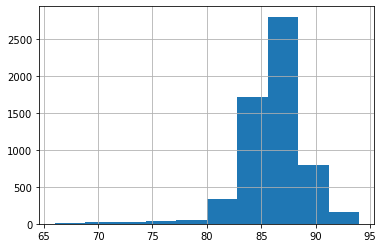

In [380]:
df['Rating'].hist();

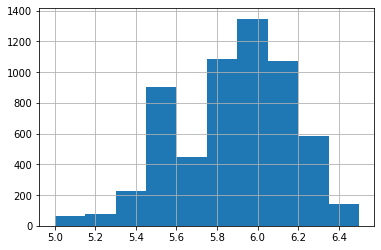

In [381]:
df['Height (Inches)'].hist();

In [388]:
pd.set_option('display.max_rows', None)
df['Team'].value_counts()

Bayern München              570
Barcelona                   517
Real Madrid                 461
Juventus                    420
Manchester City             396
Manchester United           358
Chelsea                     325
United States               220
Borussia Dortmund           205
Arsenal                     176
Paris Saint-Germain         175
Liverpool                   174
Inter                       149
Tottenham Hotspur           138
Germany                     136
France                      135
England                     126
Atlético Madrid             120
Netherlands                 101
Milan                        84
Napoli                       73
Sweden                       72
Canada                       69
Australia                    57
Roma                         52
Brazil                       44
Sevilla                      36
Valencia                     33
Norway                       31
Bayer  Leverkusen            31
Spain                        25
Fiorenti

## Save Final Dataframe into CSV

In [389]:
df.to_csv('fifa_scraped.csv')